https://www.kaggle.com/datasets/basu369victor/zinc250k/data

In [1]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.1/33.1 MB 17.3 MB/s eta 0:00:00


In [2]:
import pandas as pd

In [5]:
df = pd.read_csv("250k_rndm_zinc_drugs_clean_3.csv")

In [6]:
df.shape

(249455, 4)

In [7]:
df.head()

,smiles,logP,qed,SAS
0,CC(C)(C)c1ccc2occ(CC(=O)Nc3ccccc3F)c2c1\n,5.05060,0.702012,2.084095
1,C[C@@H]1CC(Nc2cncc(-c3nncn3C)c2)C[C@@H](C)C1\n,3.11370,0.928975,3.432004
2,N#Cc1ccc(-c2ccc(O[C@@H](C(=O)N3CCCC3)c3ccccc3)...,4.96778,0.599682,2.470633
3,CCOC(=O)[C@@H]1CCCN(C(=O)c2nc(-c3ccc(C)cc3)n3c...,4.00022,0.690944,2.822753
4,N#CC1=C(SCC(=O)Nc2cccc(Cl)c2)N=C([O-])[C@H](C#...,3.60956,0.789027,4.035182


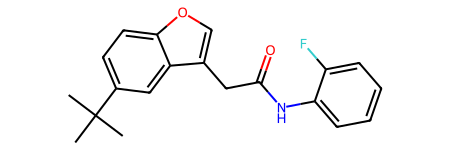

In [8]:
from rdkit import Chem

Chem.MolFromSmiles(df.loc[0, "smiles"])

In [9]:
df["smiles"] = df["smiles"].str.rstrip("\n")

それぞれの分子をOne-hot vectorにし、one-hot vectorを介して学習を進める。

In [10]:
sample = pd.DataFrame({"input": ["dog", "cat", "sheep"]})

In [11]:
sample

,input
0,dog
1,cat
2,sheep


In [12]:
chars = "abcdefghijklmnopqrstuvwxyz "
char_to_int = dict((c, i) for i, c in enumerate(chars))
char_to_int

{'a': 0,
 'b': 1,
 'c': 2,
 'd': 3,
 'e': 4,
 'f': 5,
 'g': 6,
 'h': 7,
 'i': 8,
 'j': 9,
 'k': 10,
 'l': 11,
 'm': 12,
 'n': 13,
 'o': 14,
 'p': 15,
 'q': 16,
 'r': 17,
 's': 18,
 't': 19,
 'u': 20,
 'v': 21,
 'w': 22,
 'x': 23,
 'y': 24,
 'z': 25,
 ' ': 26}

In [13]:
integer_encoded = [char_to_int[char] for char in "dog"]
integer_encoded

[3, 14, 6]

In [14]:
onehot_encoded = list()
for value in integer_encoded:
    letter = [0 for _ in range(len(chars))]
    letter[value] = 1
    onehot_encoded.append(letter)
pd.DataFrame(onehot_encoded, columns=list(chars), index=["first", "second", "third"])

,a,b,c,d,e,f,g,h,i,j,...,r,s,t,u,v,w,x,y,z,
first,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
second,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
third,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


分子生成をする際には使用可能な文字列(列方向に対応)と最大文字数（行方向に対応）を決めておく必要がある。

In [15]:
int_to_char = dict((i, c) for i, c in enumerate(chars))
int_to_char

{0: 'a',
 1: 'b',
 2: 'c',
 3: 'd',
 4: 'e',
 5: 'f',
 6: 'g',
 7: 'h',
 8: 'i',
 9: 'j',
 10: 'k',
 11: 'l',
 12: 'm',
 13: 'n',
 14: 'o',
 15: 'p',
 16: 'q',
 17: 'r',
 18: 's',
 19: 't',
 20: 'u',
 21: 'v',
 22: 'w',
 23: 'x',
 24: 'y',
 25: 'z',
 26: ' '}

In [16]:
decoded = ""
for onehot in onehot_encoded:
    index = onehot.index(1)
    decoded += int_to_char[index]

decoded

'dog'

1. ZINCデータセットからまずはcharsetを作成
2. charsetを使ってonehotエンコーディングを行う
3. デコードするコードも作成しておく

In [17]:
df["smiles"].values.tolist()[:10]

['CC(C)(C)c1ccc2occ(CC(=O)Nc3ccccc3F)c2c1',
 'C[C@@H]1CC(Nc2cncc(-c3nncn3C)c2)C[C@@H](C)C1',
 'N#Cc1ccc(-c2ccc(O[C@@H](C(=O)N3CCCC3)c3ccccc3)cc2)cc1',
 'CCOC(=O)[C@@H]1CCCN(C(=O)c2nc(-c3ccc(C)cc3)n3c2CCCCC3)C1',
 'N#CC1=C(SCC(=O)Nc2cccc(Cl)c2)N=C([O-])[C@H](C#N)C12CCCCC2',
 'CC[NH+](CC)[C@](C)(CC)[C@H](O)c1cscc1Br',
 'COc1ccc(C(=O)N(C)[C@@H](C)C/C(N)=N/O)cc1O',
 'O=C(Nc1nc[nH]n1)c1cccnc1Nc1cccc(F)c1',
 'Cc1c(/C=N/c2cc(Br)ccn2)c(O)n2c(nc3ccccc32)c1C#N',
 'C[C@@H]1CN(C(=O)c2cc(Br)cn2C)CC[C@H]1[NH3+]']

In [18]:
"".join(df["smiles"].values.tolist())

'CC(C)(C)c1ccc2occ(CC(=O)Nc3ccccc3F)c2c1C[C@@H]1CC(Nc2cncc(-c3nncn3C)c2)C[C@@H](C)C1N#Cc1ccc(-c2ccc(O[C@@H](C(=O)N3CCCC3)c3ccccc3)cc2)cc1CCOC(=O)[C@@H]1CCCN(C(=O)c2nc(-c3ccc(C)cc3)n3c2CCCCC3)C1N#CC1=C(SCC(=O)Nc2cccc(Cl)c2)N=C([O-])[C@H](C#N)C12CCCCC2CC[NH+](CC)[C@](C)(CC)[C@H](O)c1cscc1BrCOc1ccc(C(=O)N(C)[C@@H](C)C/C(N)=N/O)cc1OO=C(Nc1nc[nH]n1)c1cccnc1Nc1cccc(F)c1Cc1c(/C=N/c2cc(Br)ccn2)c(O)n2c(nc3ccccc32)c1C#NC[C@@H]1CN(C(=O)c2cc(Br)cn2C)CC[C@H]1[NH3+]CCOc1ccc(OCC)c([C@H]2C(C#N)=C(N)N(c3ccccc3C(F)(F)F)C3=C2C(=O)CCC3)c1Cc1ccc2nc(S[C@H](C)C(=O)NC3CCC(C)CC3)n(C)c(=O)c2c1O=C(N1CCc2c(F)ccc(F)c2C1)C1(O)Cc2ccccc2C1Cc1ccccc1C(=O)N1CCC2(CC1)C[C@H](c1ccccc1)C(=O)N2CCCCc1cc(NC(=O)CN2C(=O)NC3(CCC(C)CC3)C2=O)n(C)n1CC(C)Cc1nc(SCC(=O)NC[C@@H]2CCCO2)c2c(=O)n(C)c(=O)n(C)c2n1Cc1ccc(CNC(=O)c2ccccc2NC(=O)[C@@H]2CC(=O)N(c3ccc(C)cc3)C2)cc1CCCCC(=O)NC(=S)Nc1ccccc1C(=O)N1CCOCC1Cc1c(NC(=O)CSc2nc3sc4c(c3c(=O)[nH]2)CCCC4)c(=O)n(-c2ccccc2)n1CCC(C)[C@@H](Oc1cccc(Cl)c1)C(=O)N1CCC(n2cccn2)CC1CCN(CC)C(=O)C[C@@H](C)[N

In [19]:
charset = set("".join(df["smiles"].values.tolist()))
print(len(charset), charset)

34 {'(', '/', 'r', '4', '-', '[', 'S', '#', '1', 'o', 'O', 'N', 'C', '2', '=', 'F', 's', '5', 'c', ']', '+', 'l', 'H', '@', 'I', '8', '6', '\\', 'n', ')', '3', 'B', '7', 'P'}


In [20]:
charset = list(charset)
charset.insert(0, " ")
print(charset)

[' ', '(', '/', 'r', '4', '-', '[', 'S', '#', '1', 'o', 'O', 'N', 'C', '2', '=', 'F', 's', '5', 'c', ']', '+', 'l', 'H', '@', 'I', '8', '6', '\\', 'n', ')', '3', 'B', '7', 'P']


In [21]:
import numpy as np


def one_hot_encode_smiles(smiles, charset, max_length=120):
    char_to_int = dict((c, i) for i, c in enumerate(charset))
    integer_encoded = [char_to_int[char] for char in smiles]
    if len(integer_encoded) > max_length:
        integer_encoded = integer_encoded[:max_length]
    else:
        integer_encoded = integer_encoded + [0] * (max_length - len(integer_encoded))
    print(integer_encoded)
    onehot_encoded = np.zeros((max_length, len(charset)), dtype=np.float32)
    for i, val in enumerate(integer_encoded):
        onehot_encoded[i, val] = 1.0

    return onehot_encoded

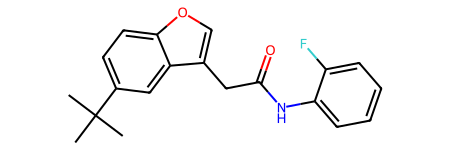

In [22]:
Chem.MolFromSmiles(df["smiles"][0])

In [23]:
ohe = one_hot_encode_smiles(df["smiles"][0], charset)
ohe

[13, 13, 1, 13, 30, 1, 13, 30, 19, 9, 19, 19, 19, 14, 10, 19, 19, 1, 13, 13, 1, 15, 11, 30, 12, 19, 31, 19, 19, 19, 19, 19, 31, 16, 30, 19, 14, 19, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [24]:
def decode_smiles_from_one_hot(one_hot_encoded, charset):

    int_to_char = {i: c for i, c in enumerate(charset)}
    integer_decoded = np.argmax(one_hot_encoded, axis=1)
    chars = [int_to_char[idx] for idx in integer_decoded]
    smiles = "".join(chars).rstrip()

    return smiles

In [25]:
smi = decode_smiles_from_one_hot(ohe, charset)
smi

'CC(C)(C)c1ccc2occ(CC(=O)Nc3ccccc3F)c2c1'

In [26]:
df["smiles"][0] == decode_smiles_from_one_hot(ohe, charset)

True